In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import sqlite3

In [11]:
query = '''
SELECT
    Station.id,
    Station.stationName,
    Station.gegrLat,
    Station.gegrLon,
    Station.cityName,
    Sensors.id as sensor_id,
    Sensors.paramName,
    Sensors.paramFormula,
    air_quality.id as air_quality_id,
    air_quality.pollutant,
    air_quality.measurement_date,
    air_quality.value
FROM
    air_quality
LEFT JOIN
    Sensors ON air_quality.sensor_id = Sensors.id
LEFT JOIN
    Station ON Sensors.stationId = Station.id;
'''

In [10]:
conn = sqlite3.connect('air_quality.db')
df = pd.read_sql(query, conn)
df.head(20)

,id,stationName,gegrLat,gegrLon,cityName,sensor_id,stationId,paramName,paramFormula,air_quality_id,pollutant,measurement_date,value
0,11,Czerniawa,50.912475,15.312190,Czerniawa,50,11,dwutlenek azotu,NO2,1,NO2,2024-05-31 08:00:00,2.41576
1,11,Czerniawa,50.912475,15.312190,Czerniawa,50,11,dwutlenek azotu,NO2,2,NO2,2024-05-31 07:00:00,2.60722
2,11,Czerniawa,50.912475,15.312190,Czerniawa,50,11,dwutlenek azotu,NO2,3,NO2,2024-05-31 06:00:00,1.80631
3,11,Czerniawa,50.912475,15.312190,Czerniawa,50,11,dwutlenek azotu,NO2,4,NO2,2024-05-31 05:00:00,1.58484
4,11,Czerniawa,50.912475,15.312190,Czerniawa,50,11,dwutlenek azotu,NO2,5,NO2,2024-05-31 04:00:00,1.91678
5,11,Czerniawa,50.912475,15.312190,Czerniawa,50,11,dwutlenek azotu,NO2,6,NO2,2024-05-31 03:00:00,1.74789
6,11,Czerniawa,50.912475,15.312190,Czerniawa,50,11,dwutlenek azotu,NO2,7,NO2,2024-05-31 02:00:00,1.44675
7,11,Czerniawa,50.912475,15.312190,Czerniawa,50,11,dwutlenek azotu,NO2,8,NO2,2024-05-31 01:00:00,1.80896
8,11,Czerniawa,50.912475,15.312190,Czerniawa,50,11,dwutlenek azotu,NO2,9,NO2,2024-05-31 00:00:00,1.98211
9,11,Czerniawa,50.912475,15.312190,Czerniawa,50,11,dwutlenek azotu,NO2,10,NO2,2024-05-30 23:00:00,2.39690


In [30]:
df['measurement_date'] = pd.to_datetime(df['measurement_date'])
df = df.sort_values('measurement_date')

In [31]:
df['pollutant'].unique()

array(['PM10', 'SO2', 'NO2', 'CO', 'C6H6', 'O3', 'PM2.5'], dtype=object)

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39916 entries, 13943 to 39819
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   id                39916 non-null  int64         
 1   stationName       39916 non-null  object        
 2   gegrLat           39916 non-null  object        
 3   gegrLon           39916 non-null  object        
 4   cityName          39916 non-null  object        
 5   sensor_id         39916 non-null  int64         
 6   stationId         39916 non-null  int64         
 7   paramName         39916 non-null  object        
 8   paramFormula      39916 non-null  object        
 9   air_quality_id    39916 non-null  int64         
 10  pollutant         39916 non-null  object        
 11  measurement_date  39916 non-null  datetime64[ns]
 12  value             38625 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(4), object(7)
memory usage: 4.3+ MB


In [33]:
df['value'].describe()

count    38625.000000
mean        42.514268
std         89.006065
min          0.000000
25%          5.375530
50%         14.047400
75%         28.800000
max        859.189000
Name: value, dtype: float64

## Odfiltrowanie po skrócie nazwy substancji

In [52]:
df_no = df[df['pollutant'] == "NO2"]
df_03 = df[df['pollutant']== "O3"]
df_pm10 = df[df['pollutant']== "PM10"]
df_pm2 = df[df['pollutant']== "PM2.5"]
df_ch = df[df['pollutant']== "C6H6"]
df_co = df[df['pollutant']== "CO"]
df_so = df[df['pollutant']== "SO2"]


In [53]:
df_03

,id,stationName,gegrLat,gegrLon,cityName,sensor_id,stationId,paramName,paramFormula,air_quality_id,pollutant,measurement_date,value
10527,444,"Tarnów, ul. Bitwy pod Studziankami",50.020169,21.004167,Tarnów,3068,444,ozon,O3,10528,O3,2024-05-29 01:00:00,NaN
37687,16533,"Warszawa, IMiGW",52.281304,20.963383,Warszawa,27047,16533,ozon,O3,37688,O3,2024-05-29 01:00:00,NaN
671,52,"Legnica, al. Rzeczypospolitej",51.204503,16.180513,Legnica,293,52,ozon,O3,672,O3,2024-05-29 01:00:00,NaN
31975,10955,"Warszawa, ul. Chrościckiego",52.207742,20.906073,Warszawa,20410,10955,ozon,O3,31976,O3,2024-05-29 01:00:00,NaN
20831,814,"Katowice, ul. Kossutha",50.264611,18.975028,Katowice,5373,814,ozon,O3,20832,O3,2024-05-29 01:00:00,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25984,986,"Szczecin, ul. Andrzejewskiego",53.380975,14.663347,Szczecin,6350,986,ozon,O3,25985,O3,2024-05-31 08:00:00,42.1878
22232,853,"Złoty Potok, Leśniczówka",50.710889,19.458797,Złoty Potok,5615,853,ozon,O3,22233,O3,2024-05-31 08:00:00,50.3926
1512,114,"Wrocław, ul. Bartnicza",51.115933,17.141125,Wrocław,644,114,ozon,O3,1513,O3,2024-05-31 08:00:00,28.4878
4928,282,Wilczopole,51.163542,22.598608,Wilczopole,1983,282,ozon,O3,4929,O3,2024-05-31 08:00:00,49.5000


In [54]:
df_03_copy = df_03[['cityName', 'measurement_date', 'value']]
df_03_copy.isnull().sum()

cityName              0
measurement_date      0
value               149
dtype: int64

In [55]:
df_03_copy = df_03_copy.dropna()
df_03_copy.isnull().sum()

cityName            0
measurement_date    0
value               0
dtype: int64

In [56]:
df_03_copy

,cityName,measurement_date,value
8790,Zielona Góra,2024-05-29 02:00:00,53.6486
6102,Pabianice,2024-05-29 02:00:00,35.4000
22286,Złoty Potok,2024-05-29 02:00:00,70.9157
16014,Nisko,2024-05-29 02:00:00,16.1967
12990,Radom,2024-05-29 02:00:00,22.5000
...,...,...,...
38976,Skarżysko-Kamienna,2024-05-31 08:00:00,58.8000
25984,Szczecin,2024-05-31 08:00:00,42.1878
22232,Złoty Potok,2024-05-31 08:00:00,50.3926
1512,Wrocław,2024-05-31 08:00:00,28.4878


In [62]:
najwieksze_miasta = ["Warszawa", "Kraków", "Łódź", "Wrocław", "Poznań", "Gdańsk", "Szczecin", "Bydgoszcz", "Lublin", "Katowice", "Białystok", "Gdynia", "Częstochowa", "Radom", "Sosnowiec", "Toruń", "Kielce", "Gliwice", "Zabrze", "Olsztyn", "Rzeszów", "Bielsko-Biała", "Ruda Śląska", "Rybnik", "Zielona Góra", "Tychy", "Gorzów Wielkopolski"]

In [63]:
df_03_copy = df_03_copy[df_03_copy['cityName'].isin(najwieksze_miasta)]

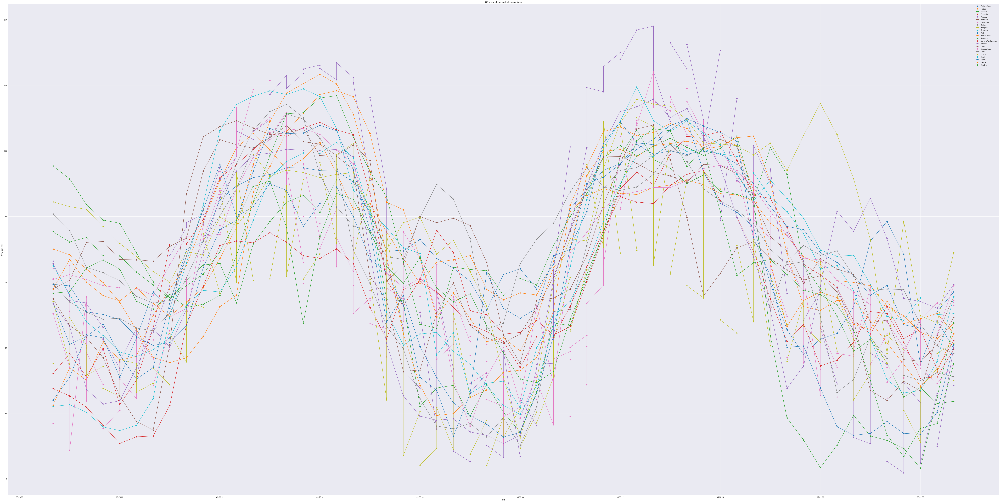

In [64]:
plt.figure(figsize=(100,50))
for city in df_03_copy['cityName'].unique():
    city_data = df_03_copy[df_03_copy['cityName']== city]
    plt.plot(city_data['measurement_date'], city_data['value'], marker='o', label=city)
plt.xlabel('date')
plt.ylabel('O3 w powietrzu')
plt.title('O3 w powietrzu z podziałem na miasta')
plt.legend()
plt.grid(True)
plt.show()

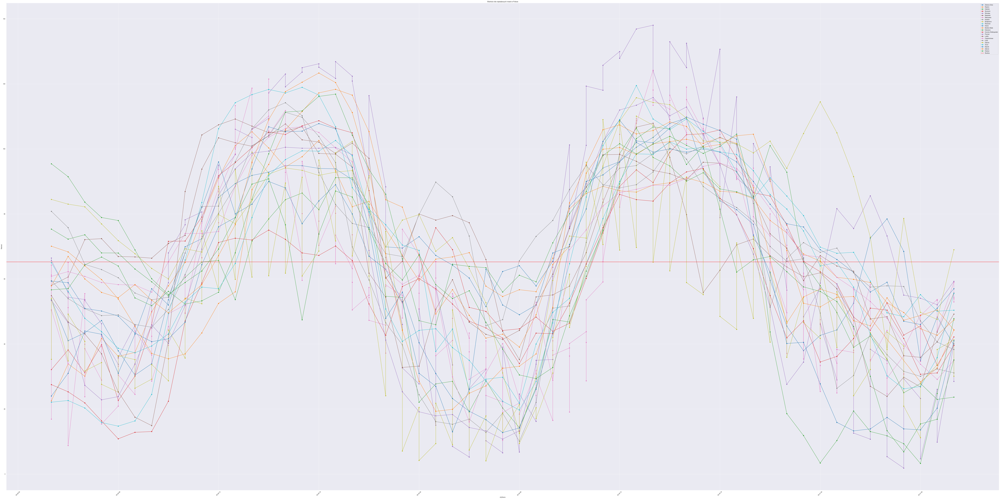

In [74]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Dane wejściowe
data = df_03_copy

df = pd.DataFrame(data)

# Lista największych miast w Polsce
najwieksze_miasta = ["Warszawa", "Kraków", "Łódź", "Wrocław", "Poznań", "Gdańsk", "Szczecin", "Bydgoszcz", "Lublin", "Katowice", "Białystok", "Gdynia", "Częstochowa", "Radom", "Sosnowiec", "Toruń", "Kielce", "Gliwice", "Zabrze", "Olsztyn", "Rzeszów", "Bielsko-Biała", "Ruda Śląska", "Rybnik", "Zielona Góra", "Tychy", "Gorzów Wielkopolski"]

# Filtrowanie danych dla największych miast
df_filtered = df[df['cityName'].isin(najwieksze_miasta)]
plt.figure(figsize=(100,50))
# Obliczanie średniej wartości
mean_value = df_filtered['value'].mean()
for city in df_03_copy['cityName'].unique():
    city_data = df_03_copy[df_03_copy['cityName']== city]
    plt.plot(city_data['measurement_date'], city_data['value'], marker='o', label=city)
# Dodawanie linii trendu (regresji liniowej)
z = np.polyfit(range(len(df_filtered['value'])), df_filtered['value'], 1)
p = np.poly1d(z)

# Wykres
# plt.figure(figsize=(10, 6))
# plt.plot(df_filtered['measurement_date'], df_filtered['value'], marker='o', label='Wartość')
# plt.plot(df_filtered['measurement_date'], p(range(len(df_filtered['value']))), "--", label='Linia trendu')
plt.axhline(y=mean_value, color='r', linestyle='-', label='Średnia')

plt.title('Wartości dla największych miast w Polsce')
plt.xlabel('cityName')
plt.ylabel('Wartość')
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()

# Wyświetlanie wykresu
plt.show()
